In [1]:
from pathlib import Path
import re
import os
import time
import pickle
import shutil
import numpy as np
from numpy.linalg import norm
from tqdm import tqdm, tqdm_notebook


# Visualization
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import PIL
from PIL import Image
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
%matplotlib inline 

# Model Building
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA


In [2]:
#%% -- At work
# current_wd = Path.cwd()
# print(current_wd)
# items = list(current_wd.glob('*'))
# pattern = re.compile('^[dD]ownloads|^.+h5$|^chrome.+|^Image.+')
# pattern = re.compile('^[dD]ownloads|^.+h5$|^chrome.+')

#%% --- at home work
at_home_dir = Path(r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images')
os.chdir(r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master')
img_folders = list(at_home_dir.glob('*'))
img_folders

[WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/angry human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/data'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/disgust human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/happy human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/sad human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/scared human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/surprise human face')]

In [61]:
# Change file names of images

for emo in tqdm(img_folders):
    for idx, img in enumerate(emo.glob('*')):
        img.rename(img.with_name(str(idx) + img.suffix))

100%|██████████| 7/7 [00:02<00:00,  3.49it/s]


In [3]:
# Feature Extraction
model = MobileNetV2(weights='imagenet', include_top=False,
                 input_shape=(224, 224, 3))
def extract_features(img_path, model):
    input_shape = (224, 224, 3)
    img = image.load_img(img_path, target_size=(
        input_shape[0], input_shape[1]))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)
    flattened_features = features.flatten()
    normalized_features = flattened_features / norm(flattened_features)
    return normalized_features

In [62]:
feature_list = []
corrupted_imgs = []
for emo in tqdm(img_folders):
    for img in emo.glob('*'):
        try:
            feature_list.append((img,extract_features(img, model)))
        except Exception as e:
            corrupted_imgs.append(img)

    

100%|██████████| 7/7 [03:05<00:00, 26.55s/it]


In [88]:
corrupted = []
input_shape = (224, 224, 3)
for emo in tqdm(img_folders):
    for img in emo.glob('*'):
        try:
            im = image.load_img(img, target_size=(
        input_shape[0], input_shape[1]))
        except:
            corrupted.append(img)

100%|██████████| 7/7 [00:59<00:00,  8.47s/it]


In [97]:
# Move corrupted images to a different folders
import shutil
for img in corrupted:
    try:
        emotion = Path(img.parent.name)
        dest = Path(r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\corrupted_imgs')
        dest = dest / emotion
        dest.mkdir(exist_ok=True)
        shutil.move(str(img), dest)
    except Exception as e:
        print(e)

In [64]:
features = []
imgs = []
for img, feature in tqdm(feature_list):
    features.append(feature)
    imgs.append(img)

100%|██████████| 2596/2596 [00:00<00:00, 867740.93it/s]


In [115]:
import math
batch_size = 64
root_dir = at_home_dir
datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)

generator = datagen.flow_from_directory(root_dir,
                                        target_size=(224, 224),
                                        batch_size=batch_size,
                                        class_mode=None,
                                        shuffle=False)

num_images = len(generator.filenames)
num_epochs = int(math.ceil(num_images / batch_size))

start_time = time.time()
feature_list = []
feature_list = model.predict_generator(generator, num_epochs)
end_time = time.time()

Found 2595 images belonging to 7 classes.


In [116]:
for i, features in enumerate(feature_list):
    feature_list[i] = features / norm(features)

feature_list = feature_list.reshape(num_images, -1)

print("Num images   = ", len(generator.classes))
print("Shape of feature_list = ", feature_list.shape)
print("Time taken in sec = ", end_time - start_time)

Num images   =  2595
Shape of feature_list =  (2595, 62720)
Time taken in sec =  144.97611665725708


In [ ]:
path = Path('./data')
path.mkdir(exist_ok=True)
pickle.dump(generator.classes, open('./data/class_ids.pickle',
                                    'wb'))
pickle.dump(generator.filenames, open('./data/filenames.pickle', 'wb'))
pickle.dump(
    feature_list,
    open('./data/features-' + 'mobilenetv2' + '.pickle', 'wb'))

In [3]:
filenames = pickle.load(open('data/filenames.pickle', 'rb'))
feature_list = pickle.load(open('./data/features-' + 'mobilenetv2' + '.pickle', 'rb'))
class_ids = pickle.load(open('./data/class_ids.pickle', 'rb')) 

In [8]:

neighbors = NearestNeighbors(n_neighbors=5, algorithm='brute',
metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors([feature_list[0]])

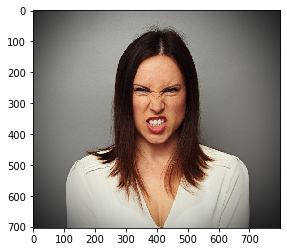

In [10]:
plt.imshow(mpimg.imread(at_home_dir / filenames[0]))

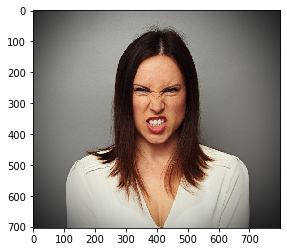

In [11]:
plt.imshow(mpimg.imread(at_home_dir / filenames[indices[0][1]]))

In [4]:
def classname(str):
    return str.split('/')[-2]


# Helper function to get the classname and filename
def classname_filename(string):
    return string


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(str(at_home_dir / filename)))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) / columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]))
        else:
            ax.set_title("Similar Image\n" + classname_filename(filenames[i]) +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.imshow(image)

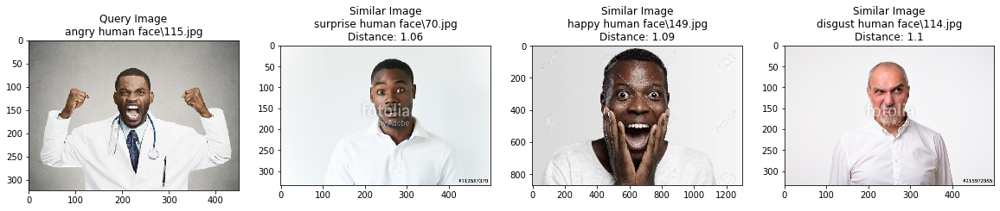

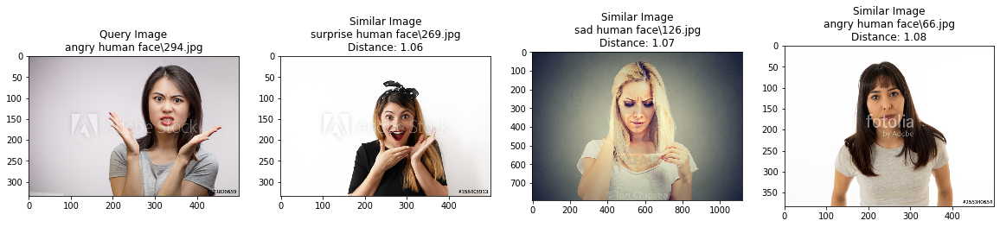

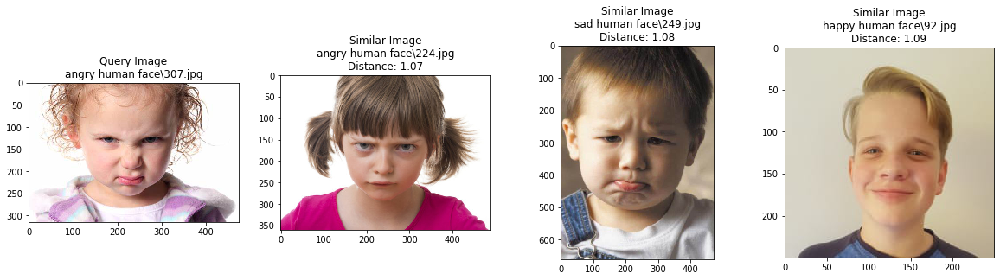

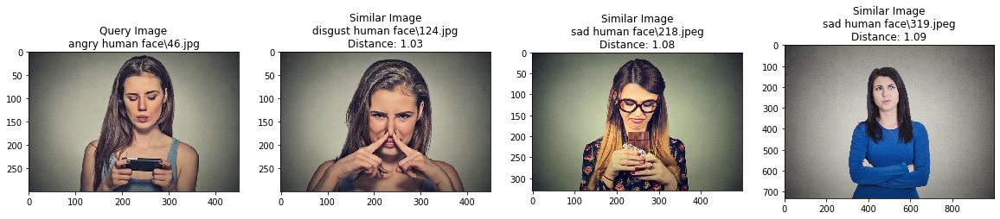

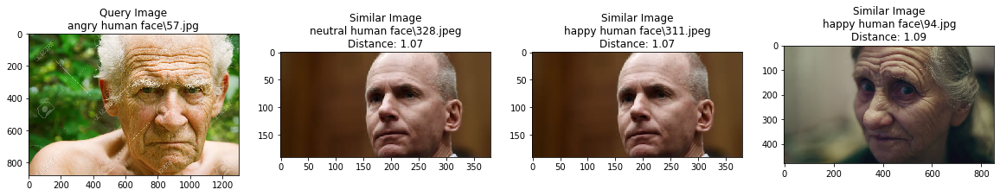

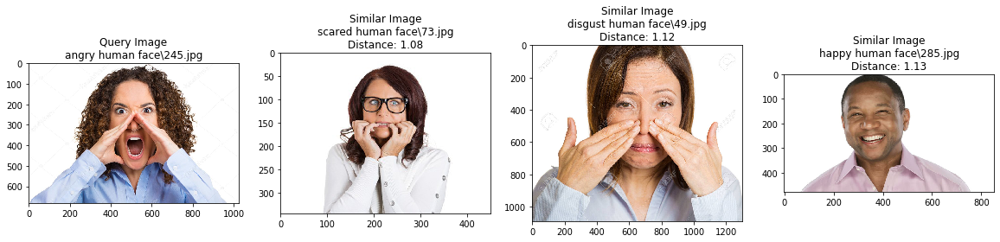

In [18]:
from numpy import random
num_images = 300
for i in range(6):
    random_image_index = random.randint(0,num_images)
    distances, indices = neighbors.kneighbors([feature_list[random_image_index]])
    # don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] +[filenames[indices[0][i]] for i in range(1,4)]
    plot_images(similar_image_paths, distances[0])

## Visualizing Clusters with t-SNE

In [111]:
len(class_ids)

2595

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2595 samples in 0.114s...
[t-SNE] Computed neighbors for 2595 samples in 2.879s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2595
[t-SNE] Computed conditional probabilities for sample 2000 / 2595
[t-SNE] Computed conditional probabilities for sample 2595 / 2595
[t-SNE] Mean sigma: 0.178382
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.005539
[t-SNE] KL divergence after 1000 iterations: 1.766367


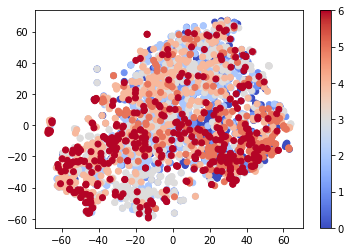

In [19]:

# Perform PCA over the features
num_feature_dimensions=100      # Set the number of features
pca = PCA(n_components = num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)
imgs = round(len(class_ids) / 2)
# For speed and clarity, we'll analyze about first half of the dataset.
# selected_features = feature_list_compressed[:imgs]
# selected_class_ids = class_ids[:imgs]
# selected_filenames = filenames

tsne_results = TSNE(n_components=2,verbose=1,metric='euclidean').fit_transform(feature_list_compressed)

# Plot a scatter plot from the generated t-SNE results
colormap = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:,0],tsne_results[:,1], c =
               class_ids, cmap=colormap)
plt.colorbar(scatter_plot)
plt.show()

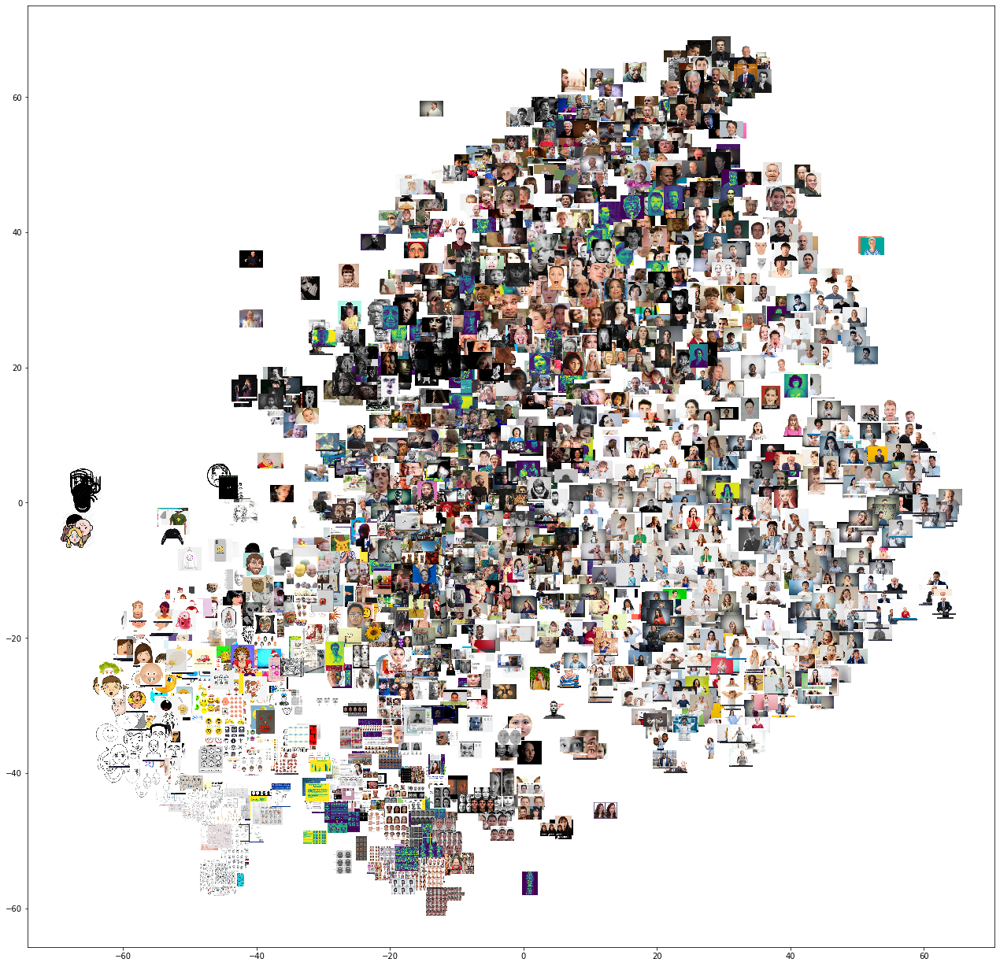

['angry human face\\116.png',
 'happy human face\\145.png',
 'neutral human face\\217.png',
 'neutral human face\\308.png',
 'neutral human face\\387.png',
 'neutral human face\\421.png',
 'sad human face\\147.png']

In [20]:


img_dir = Path(r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images')
def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    error = []
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        try:
            image = Image.open(img_dir / Path(image_path))
            image.thumbnail((100, 100), Image.ANTIALIAS)
            img = OffsetImage(image, zoom=zoom)
            anno_box = AnnotationBbox(img, (x0, y0),
                                    xycoords='data',
                                    frameon=False)
            axis.add_artist(anno_box)
        except Exception as e:
            # print(e)
            error.append(image_path)
        
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()
    return error

def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    error = plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)

        
    plt.show()
    return error
error = show_tsne(tsne_results[:, 0], tsne_results[:, 1], filenames)
error

---

## K-means clustering and PCA

In [26]:
print(np.array(filenames).shape)
print(np.array(feature_list).shape)

(2595,)
(2595, 62720)


In [8]:
'angry human face\\0.jpeg'.split('\\')

['angry human face', '0.jpeg']

In [4]:
print(len(feature_list))
print(len(filenames))
import pandas as pd
from sklearn import preprocessing
# le = preprocessing.LabelEncoder()
# data = {'Features': feature_list, 'names': filenames}
im_df = pd.DataFrame(feature_list)
im_df['names'] = filenames
# im_df.head()



2595
2595


,0,1,2,3,4,5,6,7,8,9,...,62711,62712,62713,62714,62715,62716,62717,62718,62719,names
0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.003749,0.005541,0.0,0.0,0.0,0.0,0.0,0.0,0.0,angry human face\0.jpeg
1,0.0,0.0,0.0,0.0,0.0,0.010346,0.0,0.0,0.0,0.0,...,0.001125,0.009837,0.0,0.0,0.0,0.0,0.0,0.0,0.0,angry human face\10.jpg
2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,angry human face\100.jpg
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,angry human face\101.jpg
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.002917,0.0,0.0,0.0,0.0,0.0,0.0,0.0,angry human face\102.jpg


In [13]:
# Perform PCA over the features
num_feature_dimensions=2595      # Set the number of features
pca = PCA(n_components = num_feature_dimensions)
pca.fit(im_df.iloc[:,:-1])
feature_list_compressed = pca.transform(im_df.iloc[:,:-1])
X_train_PCA = pd.DataFrame(data=feature_list_compressed)

In [14]:
X_train_PCA['names'] = im_df['names']

In [15]:
print("Variance Explained by all principal components: ", \
      sum(pca.explained_variance_ratio_))

Variance Explained by all principal components:  0.9999999808779216


In [11]:
importanceOfPrincipalComponents = pd.DataFrame(data=pca.explained_variance_ratio_)
importanceOfPrincipalComponents = importanceOfPrincipalComponents.T

In [26]:
print('Variance Captured by First 10 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:100].sum(axis=1).values)
print('Variance Captured by First 200 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:200].sum(axis=1).values)
print('Variance Captured by First 300 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:300].sum(axis=1).values)
print('Variance Captured by First 400 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:400].sum(axis=1).values)
print('Variance Captured by First 500 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:500].sum(axis=1).values)
print('Variance Captured by First 600 Principal Components: ',
      importanceOfPrincipalComponents.loc[:,0:600].sum(axis=1).values)
print('Variance Captured by First 1000 Principal Components: ',
        importanceOfPrincipalComponents.loc[:,0:1000].sum(axis=1).values)
print('Variance Captured by First 2000 Principal Components: ',
        importanceOfPrincipalComponents.loc[:,:2000].sum(axis=1).values)

Variance Captured by First 10 Principal Components:  [0.355567]
Variance Captured by First 200 Principal Components:  [0.45514297]
Variance Captured by First 300 Principal Components:  [0.52384746]
Variance Captured by First 400 Principal Components:  [0.5778455]
Variance Captured by First 500 Principal Components:  [0.6228882]
Variance Captured by First 600 Principal Components:  [0.6618638]
Variance Captured by First 1000 Principal Components:  [0.7808224]
Variance Captured by First 2000 Principal Components:  [0.9529649]


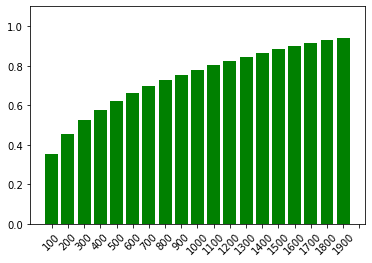

In [31]:
plt.figure()
for idx, x in enumerate(range(100,2000,100)):
    plt.bar(idx, importanceOfPrincipalComponents.loc[:,0:x].sum(axis=1).values[0], color='green')
    plt.xticks(ticks = list(range(0,20,1)), labels= list(range(100,2000,100)), rotation=45)
    plt.ylim(0,1.1)

In [38]:
from sklearn.cluster import KMeans
cutoff = 1000
n_clusters = 10
# n_init = 10
max_iter = 300
tol = 0.0001
random_state = 2018
n_jobs = 3

kMeans_inertia = pd.DataFrame(data=[],index=range(2,21), \
                              columns=['inertia'])
for n_clusters in range(2,70):
    kmeans = KMeans(n_clusters=n_clusters, max_iter=max_iter, tol=tol, random_state=random_state, \
                n_jobs=n_jobs)
    cutoff = 99
    kmeans.fit(X_train_PCA.loc[:,0:cutoff])
    kMeans_inertia.loc[n_clusters] = kmeans.inertia_

---

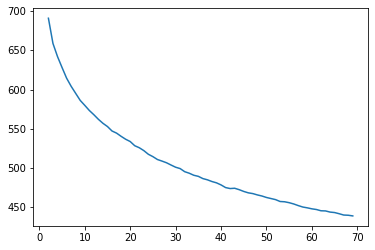

In [39]:
plt.plot(kMeans_inertia)

In [19]:
from sklearn.cluster import KMeans
cutoff = 999
n_clusters = 20
# n_init = 10
max_iter = 300
tol = 0.0001
random_state = 2018
n_jobs = 3
kmeans = KMeans(n_clusters=n_clusters, max_iter=max_iter, tol=tol, random_state=random_state, \
                n_jobs=n_jobs)
y_km = kmeans.fit_predict(X_train_PCA.iloc[:,0:cutoff])
X_train_PCA.loc[y_km==1,'names'].shape

(154,)

In [35]:
for i in range(1, 21, 1):
    group1 = X_train_PCA.loc[y_km==i,'names']
    print(f'The number of images in cluster {i} is\t:', len(group1.values))

The number of images in cluster 1 is	: 154
The number of images in cluster 2 is	: 135
The number of images in cluster 3 is	: 129
The number of images in cluster 4 is	: 160
The number of images in cluster 5 is	: 78
The number of images in cluster 6 is	: 277
The number of images in cluster 7 is	: 163
The number of images in cluster 8 is	: 99
The number of images in cluster 9 is	: 37
The number of images in cluster 10 is	: 74
The number of images in cluster 11 is	: 89
The number of images in cluster 12 is	: 134
The number of images in cluster 13 is	: 181
The number of images in cluster 14 is	: 160
The number of images in cluster 15 is	: 193
The number of images in cluster 16 is	: 168
The number of images in cluster 17 is	: 121
The number of images in cluster 18 is	: 77
The number of images in cluster 19 is	: 135
The number of images in cluster 20 is	: 0


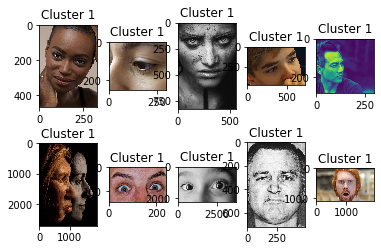

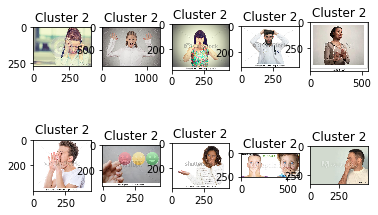

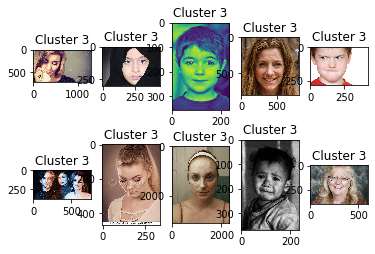

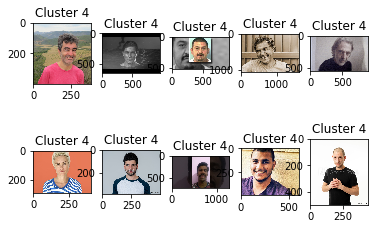

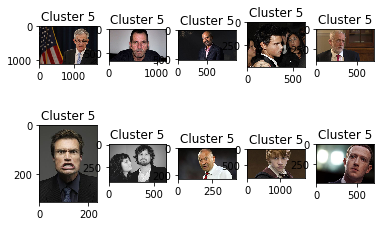

...

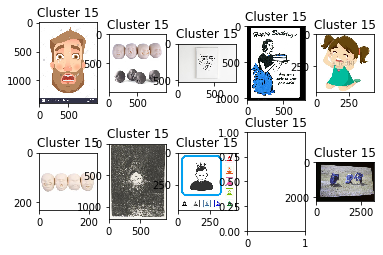

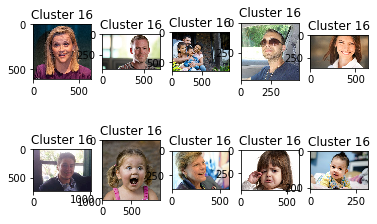

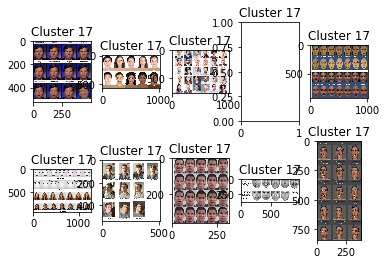

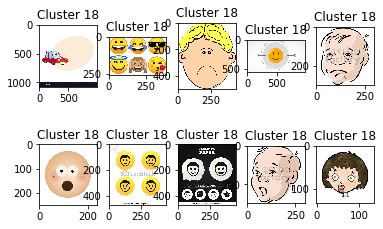

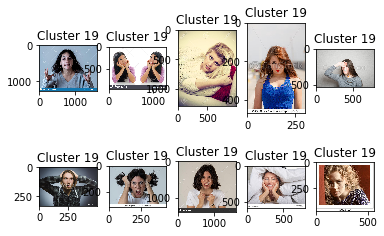

In [39]:
from random import sample
import matplotlib.image as mpimg
invalid = []
for i in range(1,21,1):
    group1 = X_train_PCA.loc[y_km==i,'names']
    if len(group1) == 0:
        pass
    else:
        small_sample = sample(list(group1.values), 10)
        fig = plt.figure()
        for idx, im in enumerate(small_sample):
            ax = fig.add_subplot(2,5,idx+1)
            ax.set_title(f'Cluster {i}')
            try:
                im = mpimg.imread(str(at_home_dir / im))
                ax.imshow(im)
            except ValueError as e:
                invalid.append(str(at_home_dir / im))

In [41]:
potential_outliers = [10,11,15,17,18]
group1 = X_train_PCA.loc[y_km==10,'names']
print(len(group1.values))
print(list(group1))

74
['happy human face\\102.jpg', 'happy human face\\108.jpg', 'happy human face\\158.jpg', 'happy human face\\204.jpg', 'happy human face\\208.jpeg', 'happy human face\\222.jpg', 'happy human face\\261.jpg', 'happy human face\\265.jpg', 'happy human face\\281.jpg', 'happy human face\\284.jpg', 'happy human face\\300.png', 'happy human face\\314.jpg', 'happy human face\\356.png', 'happy human face\\367.jpg', 'happy human face\\385.jpg', 'happy human face\\404.jpg', 'happy human face\\415.png', 'happy human face\\422.jpg', 'happy human face\\64.jpg', 'happy human face\\85.jpg', 'neutral human face\\112.jpg', 'neutral human face\\134.jpg', 'neutral human face\\148.png', 'neutral human face\\252.jpg', 'neutral human face\\263.png', 'neutral human face\\333.jpg', 'neutral human face\\342.jpg', 'neutral human face\\344.jpg', 'neutral human face\\351.jpg', 'neutral human face\\375.jpg', 'neutral human face\\50.jpg', 'sad human face\\105.jpg', 'sad human face\\108.jpg', 'sad human face\\134.pn

list(group1.values) or

In [ ]:
im_df.head()

In [27]:
dest = Path(r"E:\similarity_search")
for folder in img_folders:
    shutil.copytree(folder, dest / folder.name)
